In [0]:
# Import necessary libraries
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, when, isnull, isnan
from pyspark.sql.types import DoubleType
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression, RandomForestRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator
import mlflow
import mlflow.spark

In [0]:
# Initialize Spark session
spark = SparkSession.builder.appName("AirbnbPricePrediction").getOrCreate()

# Load the Airbnb dataset from S3
airbnbDF = spark.read.csv('s3://columbia-gr5069-main/raw/airbnb/', header=True)
airbnbDF.count()

6874

In [0]:
# Check the data
airbnbDF.write.mode('overwrite').parquet('s3://yl5780-gr5069/processed/airbnb/listings_clean')
display(airbnbDF)

host_is_superhost,cancellation_policy,instant_bookable,host_total_listings_count,neighbourhood_cleansed,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,minimum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price,bedrooms_na,bathrooms_na,beds_na,review_scores_rating_na,review_scores_accuracy_na,review_scores_cleanliness_na,review_scores_checkin_na,review_scores_communication_na,review_scores_location_na,review_scores_value_na
t,moderate,t,1.0,Western Addition,94117.0,37.769310377340766,-122.43385634488999,Apartment,Entire home/apt,3.0,1.0,1.0,2.0,Real Bed,1.0,172.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,2.0,Bernal Heights,94110.0,37.745112331410034,-122.42101788836888,Apartment,Entire home/apt,5.0,1.0,2.0,3.0,Real Bed,30.0,112.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,235.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,10.0,Haight Ashbury,94117.0,37.766689597862175,-122.45250461761628,Apartment,Private room,2.0,4.0,1.0,1.0,Real Bed,32.0,17.0,85.0,8.0,8.0,9.0,9.0,9.0,8.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,10.0,Haight Ashbury,94117.0,37.76487219421756,-122.45182799146508,Apartment,Private room,2.0,4.0,1.0,1.0,Real Bed,32.0,8.0,93.0,9.0,9.0,10.0,10.0,9.0,9.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,2.0,Western Addition,94117.0,37.775248585892676,-122.43637374831292,House,Entire home/apt,5.0,1.5,2.0,2.0,Real Bed,7.0,27.0,97.0,10.0,10.0,10.0,10.0,10.0,9.0,785.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,moderate,f,1.0,Western Addition,94115.0,37.78470745496073,-122.44555431261594,Apartment,Entire home/apt,6.0,1.0,2.0,3.0,Real Bed,2.0,31.0,90.0,9.0,8.0,10.0,10.0,9.0,9.0,255.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
t,strict_14_with_grace_period,f,2.0,Mission,94110.0,37.75918889708064,-122.42236687240562,Condominium,Private room,3.0,1.0,1.0,2.0,Real Bed,1.0,631.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,139.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,1.0,Potrero Hill,94107.0,37.76258885144137,-122.40543055237004,House,Private room,2.0,1.0,1.0,1.0,Real Bed,1.0,434.0,94.0,9.0,9.0,10.0,10.0,10.0,9.0,135.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
t,moderate,f,1.0,Mission,94110.0,37.75874294929672,-122.4132720164374,Apartment,Entire home/apt,6.0,1.0,2.0,3.0,Real Bed,3.0,307.0,96.0,10.0,10.0,10.0,9.0,9.0,9.0,265.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,moderate,f,1.0,Nob Hill,94109.0,37.79142746368994,-122.41543567951581,Apartment,Entire home/apt,2.0,1.0,0.0,1.0,Real Bed,30.0,18.0,99.0,10.0,10.0,10.0,10.0,10.0,10.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [0]:
filePath = "s3://yl5780-gr5069/processed/airbnb/listings_clean/"
airbnbDF = spark.read.parquet(filePath)

airbnbDF = airbnbDF.withColumn("bedrooms", airbnbDF["bedrooms"].cast(DoubleType())).withColumn("price", airbnbDF["price"].cast(DoubleType()))

In [0]:
## Task 1: Create Two Tables for Predictions [20 pts]
# Table for Linear Regression predictions
spark.sql("""
CREATE TABLE IF NOT EXISTS airbnb_linear_predictions (
  id STRING,
  actual_price DOUBLE,
  predicted_price DOUBLE,
  neighborhood STRING,
  room_type STRING,
  model_version STRING,
  prediction_timestamp TIMESTAMP
)
USING DELTA
""")

# Table for Random Forest predictions
spark.sql("""
CREATE TABLE IF NOT EXISTS airbnb_rf_predictions (
  id STRING,
  actual_price DOUBLE,
  predicted_price DOUBLE,
  neighborhood STRING,
  room_type STRING,
  model_version STRING,
  prediction_timestamp TIMESTAMP
)
USING DELTA
""")

# Verify tables were created
display(spark.sql("SHOW TABLES IN default"))

database,tableName,isTemporary
default,airbnb_linear_predictions,false
default,airbnb_rf_predictions,false
default,pit_stops,false


In [0]:
# Data cleaning and preparation
def preprocess_data(df):
    """
    Clean and prepare the Airbnb dataset for modeling
    """
    # Convert price to numeric and handle missing values
    df = df.withColumn("price", col("price").cast(DoubleType()))
    
    # Convert review scores to numeric
    review_columns = ["review_scores_rating", "review_scores_accuracy", 
                     "review_scores_cleanliness", "review_scores_checkin",
                     "review_scores_communication", "review_scores_location",
                     "review_scores_value"]
    
    for col_name in review_columns:
        df = df.withColumn(col_name, col(col_name).cast(DoubleType()))
    
    # Convert other numeric features
    numeric_columns = ["latitude", "longitude", "accommodates", "bathrooms", 
                      "bedrooms", "beds", "minimum_nights"]
    
    for col_name in numeric_columns:
        df = df.withColumn(col_name, col(col_name).cast(DoubleType()))
    
    # Handle missing values - fill with median or mode
    df = df.fillna({
        "bathrooms": 1.0,
        "bedrooms": 1.0,
        "beds": 1.0,
        "review_scores_rating": 90.0,  # Assuming 90 is a reasonable default rating
        "minimum_nights": 1.0
    })
    
    # Filter out rows with missing price (our target variable)
    df = df.filter(col("price").isNotNull())
    
    return df

# Apply preprocessing
cleaned_df = preprocess_data(airbnbDF)
display(cleaned_df)

host_is_superhost,cancellation_policy,instant_bookable,host_total_listings_count,neighbourhood_cleansed,zipcode,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,minimum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price,bedrooms_na,bathrooms_na,beds_na,review_scores_rating_na,review_scores_accuracy_na,review_scores_cleanliness_na,review_scores_checkin_na,review_scores_communication_na,review_scores_location_na,review_scores_value_na
t,moderate,t,1.0,Western Addition,94117.0,37.769310377340766,-122.43385634488999,Apartment,Entire home/apt,3.0,1.0,1.0,2.0,Real Bed,1.0,172.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,2.0,Bernal Heights,94110.0,37.745112331410034,-122.42101788836888,Apartment,Entire home/apt,5.0,1.0,2.0,3.0,Real Bed,30.0,112.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,235.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,10.0,Haight Ashbury,94117.0,37.766689597862175,-122.45250461761628,Apartment,Private room,2.0,4.0,1.0,1.0,Real Bed,32.0,17.0,85.0,8.0,8.0,9.0,9.0,9.0,8.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,10.0,Haight Ashbury,94117.0,37.76487219421756,-122.45182799146508,Apartment,Private room,2.0,4.0,1.0,1.0,Real Bed,32.0,8.0,93.0,9.0,9.0,10.0,10.0,9.0,9.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,2.0,Western Addition,94117.0,37.775248585892676,-122.43637374831292,House,Entire home/apt,5.0,1.5,2.0,2.0,Real Bed,7.0,27.0,97.0,10.0,10.0,10.0,10.0,10.0,9.0,785.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,moderate,f,1.0,Western Addition,94115.0,37.78470745496073,-122.44555431261594,Apartment,Entire home/apt,6.0,1.0,2.0,3.0,Real Bed,2.0,31.0,90.0,9.0,8.0,10.0,10.0,9.0,9.0,255.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
t,strict_14_with_grace_period,f,2.0,Mission,94110.0,37.75918889708064,-122.42236687240562,Condominium,Private room,3.0,1.0,1.0,2.0,Real Bed,1.0,631.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,139.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,strict_14_with_grace_period,f,1.0,Potrero Hill,94107.0,37.76258885144137,-122.40543055237004,House,Private room,2.0,1.0,1.0,1.0,Real Bed,1.0,434.0,94.0,9.0,9.0,10.0,10.0,10.0,9.0,135.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
t,moderate,f,1.0,Mission,94110.0,37.75874294929672,-122.4132720164374,Apartment,Entire home/apt,6.0,1.0,2.0,3.0,Real Bed,3.0,307.0,96.0,10.0,10.0,10.0,9.0,9.0,9.0,265.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f,moderate,f,1.0,Nob Hill,94109.0,37.79142746368994,-122.41543567951581,Apartment,Entire home/apt,2.0,1.0,0.0,1.0,Real Bed,30.0,18.0,99.0,10.0,10.0,10.0,10.0,10.0,10.0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


2025/04/25 05:58:47 INFO mlflow.tracking.fluent: Experiment with name '/Users/yl5780@columbia.edu/airbnb_price_prediction' does not exist. Creating a new experiment.
2025/04/25 05:59:17 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/04/25 05:59:50 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/2320464553185606/9be5c71aba064ab58280b3184241b56a/artifacts/linear_regression_model/sparkml, flavor: spark). Fall back to return ['pyspark==3.5.0']. Set logging level to DEBUG to see the full traceback. 
/databricks/python/lib/python3.11/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
2025/04/25 06:00:06 INFO m

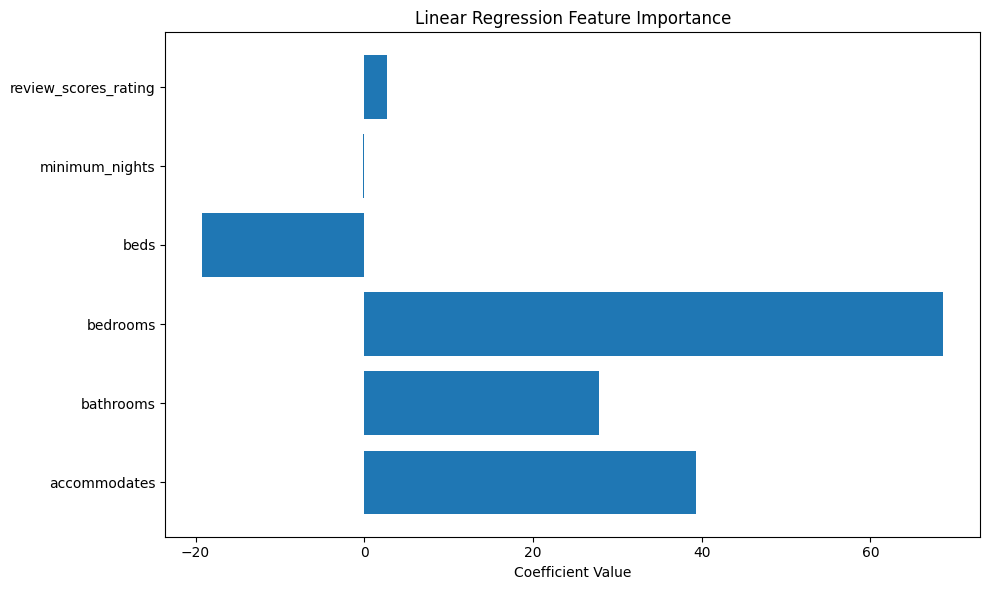

In [0]:
## Task 2: Build Two Predictive Models with MLflow [30 pts]
# Model 1: Linear Regression
# Start MLflow experiment
mlflow.set_experiment("/Users/yl5780@columbia.edu/airbnb_price_prediction")

with mlflow.start_run(run_name="Linear_Regression"):
    # Log parameters
    mlflow.log_param("model_type", "Linear Regression")
    mlflow.log_param("target", "price")
    
    # Define features and target
    feature_columns = ["accommodates", "bathrooms", "bedrooms", "beds", 
                      "minimum_nights", "review_scores_rating"]
    
    # Create vector assembler
    assembler = VectorAssembler(
        inputCols=feature_columns,
        outputCol="features"
    )
    
    # Initialize Linear Regression model
    lr = LinearRegression(
        featuresCol="features",
        labelCol="price",
        maxIter=10,
        regParam=0.3,
        elasticNetParam=0.8
    )
    
    # Create pipeline
    pipeline = Pipeline(stages=[assembler, lr])
    
    # Split data into train and test sets
    train_data, test_data = cleaned_df.randomSplit([0.8, 0.2], seed=42)
    
    # Train model
    model = pipeline.fit(train_data)
    
    # Make predictions
    predictions = model.transform(test_data)
    
    # Evaluate model
    evaluator = RegressionEvaluator(
        labelCol="price",
        predictionCol="prediction",
        metricName="rmse"
    )
    
    rmse = evaluator.evaluate(predictions)
    mae = evaluator.evaluate(predictions, {evaluator.metricName: "mae"})
    r2 = evaluator.evaluate(predictions, {evaluator.metricName: "r2"})
    mse = evaluator.evaluate(predictions, {evaluator.metricName: "mse"})
    
    # Log metrics
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("r2", r2)
    mlflow.log_metric("mse", mse)
    
    # Log model
    mlflow.spark.log_model(model, "linear_regression_model")
    
    # Log artifacts (feature importance and sample predictions)
    import pandas as pd
    import matplotlib.pyplot as plt
    
    # Get feature importance
    lr_model = model.stages[-1]
    coeff_df = pd.DataFrame({
        "Feature": feature_columns,
        "Coefficient": lr_model.coefficients
    })
    
    # Save feature importance as artifact
    coeff_df.to_csv("feature_importance.csv", index=False)
    mlflow.log_artifact("feature_importance.csv")
    
    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(coeff_df["Feature"], coeff_df["Coefficient"])
    plt.title("Linear Regression Feature Importance")
    plt.xlabel("Coefficient Value")
    plt.tight_layout()
    plt.savefig("feature_importance.png")
    mlflow.log_artifact("feature_importance.png")
    
    # Log sample predictions
    sample_predictions = predictions.select("price", "prediction").limit(100).toPandas()
    sample_predictions.to_csv("sample_predictions.csv", index=False)
    mlflow.log_artifact("sample_predictions.csv")
    
    # Register model
    mlflow.spark.log_model(
        model,
        "model",
        registered_model_name="airbnb_price_linear_regression"
    )

2025/04/25 06:01:36 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/04/25 06:02:10 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/2320464553185606/1f76611e9195440ab78b4dbe7ab04916/artifacts/random_forest_model/sparkml, flavor: spark). Fall back to return ['pyspark==3.5.0']. Set logging level to DEBUG to see the full traceback. 
2025/04/25 06:02:26 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/04/25 06:03:01 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (

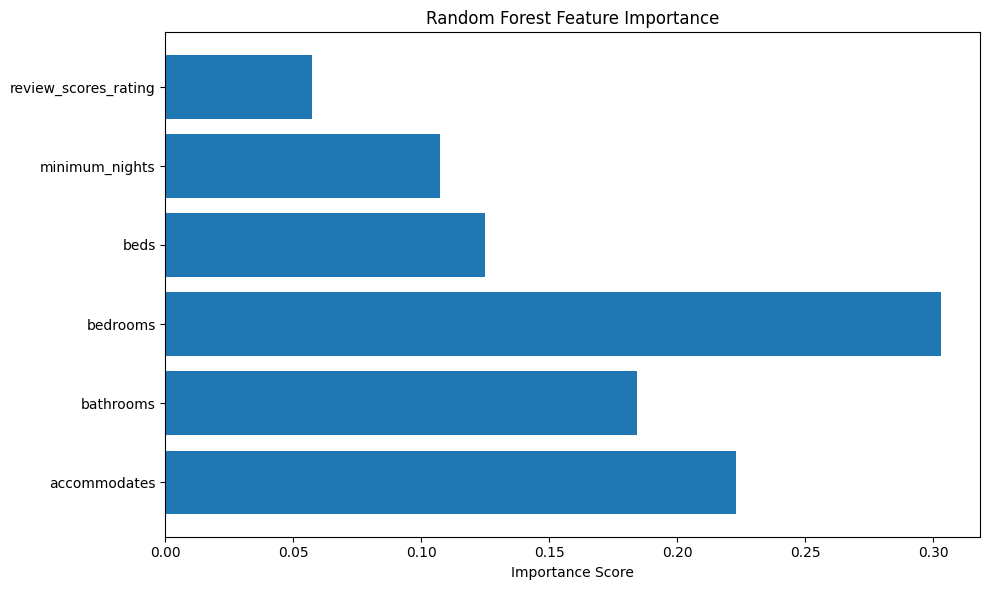

In [0]:
# Model 2: Random Forest Regression
with mlflow.start_run(run_name="Random_Forest"):
    # Log parameters
    mlflow.log_param("model_type", "Random Forest")
    mlflow.log_param("target", "price")
    
    # Define features and target (same as before)
    feature_columns = ["accommodates", "bathrooms", "bedrooms", "beds", 
                      "minimum_nights", "review_scores_rating"]
    
    # Create vector assembler
    assembler = VectorAssembler(
        inputCols=feature_columns,
        outputCol="features"
    )
    
    # Initialize Random Forest model
    rf = RandomForestRegressor(
        featuresCol="features",
        labelCol="price",
        numTrees=100,
        maxDepth=5,
        seed=42
    )
    
    # Create pipeline
    pipeline = Pipeline(stages=[assembler, rf])
    
    # Use same train/test split as before for fair comparison
    # train_data, test_data already defined
    
    # Train model
    model = pipeline.fit(train_data)
    
    # Make predictions
    predictions = model.transform(test_data)
    
    # Evaluate model
    evaluator = RegressionEvaluator(
        labelCol="price",
        predictionCol="prediction",
        metricName="rmse"
    )
    
    rmse = evaluator.evaluate(predictions)
    mae = evaluator.evaluate(predictions, {evaluator.metricName: "mae"})
    r2 = evaluator.evaluate(predictions, {evaluator.metricName: "r2"})
    mse = evaluator.evaluate(predictions, {evaluator.metricName: "mse"})
    
    # Log metrics
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("r2", r2)
    mlflow.log_metric("mse", mse)
    
    # Log model
    mlflow.spark.log_model(model, "random_forest_model")
    
    # Log artifacts (feature importance and sample predictions)
    import pandas as pd
    import matplotlib.pyplot as plt
    
    # Get feature importance
    rf_model = model.stages[-1]
    feature_imp_df = pd.DataFrame({
        "Feature": feature_columns,
        "Importance": rf_model.featureImportances.toArray()
    })
    
    # Save feature importance as artifact
    feature_imp_df.to_csv("rf_feature_importance.csv", index=False)
    mlflow.log_artifact("rf_feature_importance.csv")
    
    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(feature_imp_df["Feature"], feature_imp_df["Importance"])
    plt.title("Random Forest Feature Importance")
    plt.xlabel("Importance Score")
    plt.tight_layout()
    plt.savefig("rf_feature_importance.png")
    mlflow.log_artifact("rf_feature_importance.png")
    
    # Log sample predictions
    sample_predictions = predictions.select("price", "prediction").limit(100).toPandas()
    sample_predictions.to_csv("rf_sample_predictions.csv", index=False)
    mlflow.log_artifact("rf_sample_predictions.csv")
    
    # Register model
    mlflow.spark.log_model(
        model,
        "model",
        registered_model_name="airbnb_price_random_forest"
    )

In [0]:
## Task 3: Store Predictions in Database Tables [30 pts]
# Store Linear Regression Predictions
from pyspark.sql.functions import monotonically_increasing_id, col, lit, current_timestamp

linear_predictions_with_id = linear_predictions.withColumn("predicted_id", monotonically_increasing_id())

predictions_to_store = linear_predictions_with_id.select(
    col("predicted_id").cast("string").alias("id"), 
    col("price").alias("actual_price"),
    col("prediction").alias("predicted_price"),
    col("neighbourhood_cleansed").alias("neighborhood"),
    col("room_type"),
    lit("v1").alias("model_version"),
    current_timestamp().alias("prediction_timestamp")
)

predictions_to_store.write.format("delta").mode("append") \
    .saveAsTable("default.airbnb_linear_predictions")

display(spark.sql("SELECT * FROM default.airbnb_linear_predictions LIMIT 10"))

id,actual_price,predicted_price,neighborhood,room_type,model_version,prediction_timestamp
0,170.0,171.3821687363743,Western Addition,Entire home/apt,v1,2025-04-25T06:16:52.163Z
1,235.0,298.08964284123545,Bernal Heights,Entire home/apt,v1,2025-04-25T06:16:52.163Z
2,65.0,198.37505436249648,Haight Ashbury,Private room,v1,2025-04-25T06:16:52.163Z
3,65.0,219.67986990078066,Haight Ashbury,Private room,v1,2025-04-25T06:16:52.163Z
4,785.0,331.7872003333199,Western Addition,Entire home/apt,v1,2025-04-25T06:16:52.163Z
5,255.0,320.1187488807557,Western Addition,Entire home/apt,v1,2025-04-25T06:16:52.163Z
6,139.0,174.0452706786598,Mission,Private room,v1,2025-04-25T06:16:52.163Z
7,135.0,143.2065938003136,Potrero Hill,Private room,v1,2025-04-25T06:16:52.163Z
8,265.0,335.9556967826029,Mission,Entire home/apt,v1,2025-04-25T06:16:52.163Z
9,120.0,83.81483937570829,Nob Hill,Entire home/apt,v1,2025-04-25T06:16:52.163Z


In [0]:
# Store Random Forest Predictions

from pyspark.sql.functions import monotonically_increasing_id

rf_model = mlflow.spark.load_model("models:/airbnb_price_random_forest/latest")
rf_predictions = rf_model.transform(cleaned_df)
rf_predictions_with_id = rf_predictions.withColumn("id", monotonically_increasing_id().cast("string"))

predictions_to_store = rf_predictions_with_id.select(
    col("id"),
    col("price").alias("actual_price"),
    col("prediction").alias("predicted_price"),
    col("neighbourhood_cleansed").alias("neighborhood"),
    col("room_type"),
    lit("v1").alias("model_version"),
    current_timestamp().alias("prediction_timestamp")
)

predictions_to_store.write.format("delta").mode("append") \
    .saveAsTable("default.airbnb_rf_predictions")

display(spark.sql("SELECT * FROM default.airbnb_rf_predictions LIMIT 10"))

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.11/site-packages/mlflow/store/artifact/utils/models.py:32: FutureWarning: ``mlflow.tracking.client.MlflowClient.get_latest_versions`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/2.11.3/model-registry.html#migrating-from-stages
  latest = client.get_latest_versions(name, None if stage is None else [stage])
2025/04/25 06:22:45 INFO mlflow.spark: 'models:/airbnb_price_random_forest/latest' resolved as 'dbfs://databricks/databricks/mlflow-registry/a64f143a32d84fd8af939566ec04d2ed/models/model'
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.11/site-packages/mlflow/store/artifact/utils/models.py:32: FutureWarning: ``mlflow.tracking.client.MlflowClient.get_latest_versions`` is deprecated since 2.9.0. Model registry stages will be removed in a future 

id,actual_price,predicted_price,neighborhood,room_type,model_version,prediction_timestamp
0,170.0,161.22644243814392,Western Addition,Entire home/apt,v1,2025-04-25T06:23:00.306Z
1,235.0,222.0041107942216,Bernal Heights,Entire home/apt,v1,2025-04-25T06:23:00.306Z
2,65.0,103.51808787324543,Haight Ashbury,Private room,v1,2025-04-25T06:23:00.306Z
3,65.0,105.8386392349222,Haight Ashbury,Private room,v1,2025-04-25T06:23:00.306Z
4,785.0,291.88429043057874,Western Addition,Entire home/apt,v1,2025-04-25T06:23:00.306Z
5,255.0,265.60510119384236,Western Addition,Entire home/apt,v1,2025-04-25T06:23:00.306Z
6,139.0,166.59788392810083,Mission,Private room,v1,2025-04-25T06:23:00.306Z
7,135.0,128.86142264098754,Potrero Hill,Private room,v1,2025-04-25T06:23:00.306Z
8,265.0,280.8310886559672,Mission,Entire home/apt,v1,2025-04-25T06:23:00.306Z
9,120.0,149.64317023289755,Nob Hill,Entire home/apt,v1,2025-04-25T06:23:00.306Z
